#DelayCat Delay Line Variation Experimental Results

In this notebook, audio from DelayCat with default settings and various target radii, ranging from 0.0 to 1.0, are compared to a control delay signal from a standard commercial delay plugin. Comparison will done via computing the per sample difference in waveform as well as the difference in feature analysis between the different signals.

With target radius of 0, we expect to find 0 variation from the control signal. Then as the target radius increases, we expect to find corrolated increase in waveform and feature analysis difference metrics.

#Installs
Only necessary for some environments, such as binder.

In [1]:
# uncomment if necessary or set up your environment accordingly
#%pip install matplotlib
#%pip install scipy
#%pip install sklearn
#%pip install scikit-learn
#%pip install librosa

#Imports

In [2]:
%matplotlib inline
from pathlib import Path
import numpy, scipy, matplotlib.pyplot as plt, sklearn, urllib, IPython.display as ipd
import librosa, librosa.display
import urllib.request
from scipy.io.wavfile import write
from statistics import mean

#Load Files and Format Trial Data

Currently, these files are hosted through a mounted drive, so they probably won't work for other people. This will be changed.

In [3]:
sr = 44100

dry_fn = urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1GkRFo0h3sJwzG6wXctxYsdIndDxEorc3')[0]
dry, dry_sr = librosa.load(dry_fn, sr=sr)

control_fn = urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1JhOk62e3jNNb2YYRX78c8ti8suussKhP')[0]
control, control_sr = librosa.load(control_fn, sr=sr)

# tr = 0.00
dcdefault_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1REeR9ygPdbZURyX5UdWWusfbPPrIMzyR')[0]]
dcdefault = [librosa.load(fn, sr=sr)[0] for fn in dcdefault_fn]

# all further trials are average of 3 recordings because of the inherent randomness involved with expanded target radius

# tr = 0.05
dcvariation1_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1su_PEL3a5AB7bNkgt6benxkR7YcOclld')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1BJ90sUAghBBG05Wc3YHwshj2kobmS0o4')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1F3T-mkPiufKQu8DyLJC2zuJetrJ-UOKJ')[0]]
dcvariation1 = [librosa.load(fn, sr=sr)[0] for fn in dcvariation1_fn]

# tr = 0.10
dcvariation2_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1oqCR7pKvifU4HKpZssz4WOHHDNMQkSsp')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1EvhYXH6NUkbevxkSSeHzgxFuKmOVGu95')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1Ka0z3t98gy7C1Ct3N8ly9RxU6nwnTb71')[0]]
dcvariation2 = [librosa.load(fn, sr=sr)[0] for fn in dcvariation2_fn]

# tr = 0.15
dcvariation3_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1vg8PSUS4Ajlo_8-iSIAOTrF1lPIzMXQE')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1Smj3Sp-jT9uN3iYjKJyF5at5_b6ljoeM')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1ozAOHBPBw0tm4lTk5843gp9nm-_D6jvZ')[0]]
dcvariation3 = [librosa.load(fn, sr=sr)[0] for fn in dcvariation3_fn]

# tr = 0.25
dcvariation4_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1bkxgpzhVhnt5FBJaL5bVeNlC20EKalfn')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=11mS7Cp0IkgE5sE4oO71tZrJ83bySyet2')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1Ia4dwGfg6gaov1mmFbCiWRmduT4gKRpR')[0]]
dcvariation4 = [librosa.load(fn, sr=sr)[0] for fn in dcvariation4_fn]

# tr = 0.50
dcvariation5_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1WAWruRqD2dS5adocwg4vF9V4WpMnbscA')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1fAmrNqgYy7Kiu0pvuj-g965iMI3Hs5Rl')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1bOgLh_tgw4zEEHcBtyy0CpPSq3eXDvTy')[0]]
dcvariation5 = [librosa.load(fn, sr=sr)[0] for fn in dcvariation5_fn]

# tr = 0.75
dcvariation6_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=17pmwwuU0ohkD3TUlSsmkr6RjZ2uixd-F')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1iCd86sC_PiuSOqDBvgQkKOaisdttWmc-')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1Qx8Nlt8PtafkiF2yJW8juAAZ4-kKrWHc')[0]]
dcvariation6 = [librosa.load(fn, sr=sr)[0] for fn in dcvariation6_fn]

# tr = 1.00
dcvariation7_fn = [urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1EoyfTNBlzESzd1XE5t6yZteGghyPQ-Ds')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1A9OJsOvXowUxH-HrvQ0q4T7eW3h5-KS-')[0],
                   urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=15_yzg9Hnbk6no9oHIBzFrvw2ktyQEjfJ')[0]]
dcvariation7 = [librosa.load(fn, sr=sr)[0] for fn in dcvariation7_fn]

# 7 trials
trials = [{"target_radius" : 0.00, "audio" : dcdefault, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diffs" : None},
          {"target_radius" : 0.05, "audio" : dcvariation1, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.10, "audio" : dcvariation2, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.15, "audio" : dcvariation3, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.25, "audio" : dcvariation4, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.50, "audio" : dcvariation5, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.75, "audio" : dcvariation6, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 1.00, "audio" : dcvariation7, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None}]

def extract_features(audio):
  features = {'flatness' : numpy.array([librosa.feature.spectral_flatness(y=audio[i: i + 1024])[0, 0] for i in range(0, len(audio), 1024)]),
              'rms' : numpy.array([librosa.feature.rms(y=audio[i: i + 1024])[0, 0] for i in range(0, len(audio), 1024)]),
              'centroid' : numpy.array([librosa.feature.spectral_centroid(y=audio[i: i + 1024])[0, 0] for i in range(0, len(audio), 1024)])}
  return features

control_features = extract_features(control)

def conduct_trial(trial):
  print("trial:", trial, '| target radius = ', trials[trial]['target_radius'])
  print("Delayed Signal:")
  display(ipd.Audio(trials[trial]['audio'][0], rate=sr))

  bias = 1 # bias of 1 because of 1 sample shifting due to the read / write order of the audio processor
  trials[trial]['diffs'] = [numpy.asarray([control[i + bias] - audio[i] for i in range(len(control) - bias)]) for audio in trials[trial]['audio']]

  # just print the first trial waveform, because an averaged waveform won't read well
  print("Diff:")
  if (trial == 0):
    # must use this method to avoid automatic normalization of audio output
    scaled = numpy.int16(trials[trial]['diffs'][0] * 32767)
    fname = str(trial) + '_diff.wav'
    write(fname, sr, scaled)
    display(ipd.Audio(fname, rate=sr))
  else:
    # want normalization for other trials because they may have difference samples > 1
    display(ipd.Audio(trials[trial]['diffs'][0], rate=sr))

  plt.figure(figsize=(12, 4))
  librosa.display.waveshow(trials[trial]['diffs'][0], sr=sr)
  plt.ylim([-2.0, 2.0]) # use 2.0 because diff samples more be as large as 2
  plt.title('waveform diff')

  trials[trial]['total_diff'] = mean([numpy.sum(numpy.abs(diff)) for diff in trials[trial]['diffs']])

  trials[trial]['features'] = [extract_features(audio) for audio in trials[trial]['audio']]
  trials[trial]['feature_diffs'] = {'flatness' : [numpy.subtract(features['flatness'], control_features['flatness']) for features in trials[trial]['features']],
                                    'rms' : [numpy.subtract(features['rms'], control_features['rms']) for features in trials[trial]['features']],
                                    'centroid' : [numpy.subtract(features['centroid'], control_features['centroid']) for features in trials[trial]['features']]}
  trials[trial]['feature_total_diffs'] = {'flatness' : mean([numpy.sum(numpy.abs(diff)) for diff in trials[trial]['feature_diffs']['flatness']]),
                                          'rms' : mean([numpy.sum(numpy.abs(diff)) for diff in trials[trial]['feature_diffs']['rms']]),
                                          'centroid' : mean([numpy.sum(numpy.abs(diff)) for diff in trials[trial]['feature_diffs']['centroid']])}

  plt.show()

  print('Feature Total Diffs:')
  print('waveform:', trials[trial]['total_diff'])
  print('flatness:', trials[trial]['feature_total_diffs']['flatness'])
  print('rms:', trials[trial]['feature_total_diffs']['rms'])
  print('centroid:', trials[trial]['feature_total_diffs']['centroid'])


/usr/local/lib/python3.9/dist-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1024
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=30
  warnings.warn(


##Dry Audio

Original, undelayed signal input into delay plugins.

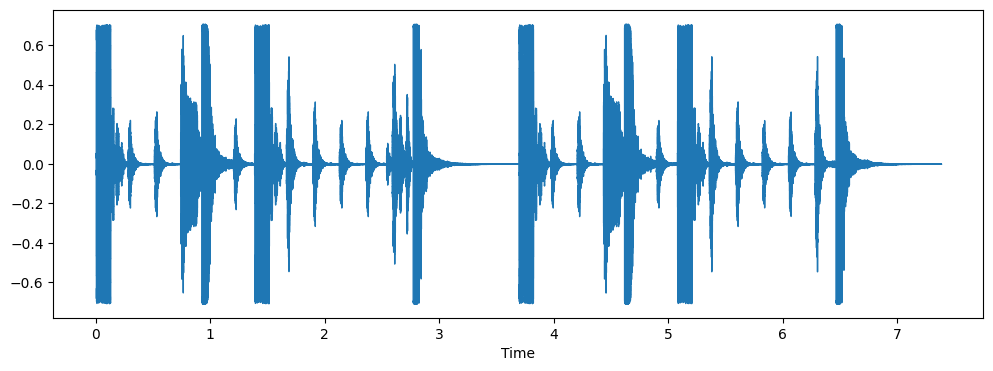

In [4]:
display(ipd.Audio(dry, rate=sr))

plt.figure(figsize=(12, 4))
librosa.display.waveshow(dry, sr=sr)

##Control Audio

Delayed signal from an standard delay plugin.

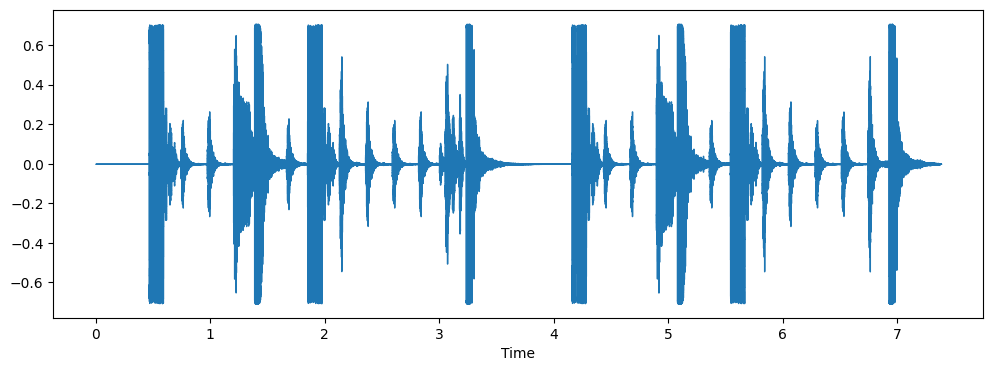

In [5]:
display(ipd.Audio(control, rate=sr))

plt.figure(figsize=(12, 4))
librosa.display.waveshow(control, sr=sr)

#Delay Line Testing

Here, we test the ability of the architecture to behave exactly like a normal delay by comparing the resulting delayed signal of DelayCat with default parameters and target radius of 0 to the control delay signal.

##Delay Cat Default Audio

DelayCat delayed signal with parameters such that it will behave exactly like a normal delay line (TargetRadius = 0, Shifting = true).

trial: 0 | target radius =  0.0
Delayed Signal:


Diff:


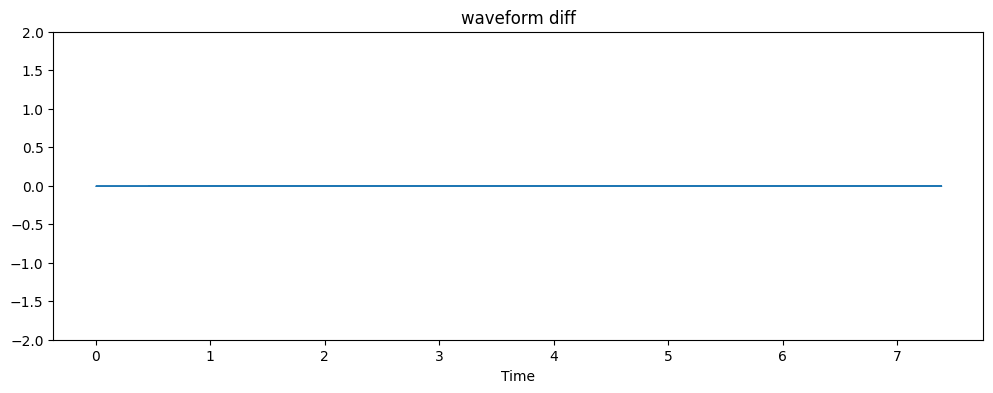

Feature Total Diffs:
waveform: 0.001327559
flatness: 2.6012788
rms: 0.0152054
centroid: 10578.314311025028


In [6]:
conduct_trial(0)

As we can see, there is no difference between our trial with target radius = 0 and the control signal.

This shows DelayCat's ability to perform exactly like the normal delay line (though there is actually some very minimal difference, out of the range of hearing).

#Variation Experiment

With an expanded target radius, we can see how natural sounding variation is introduced by selecting qualitatively similar but different segments.

We expect to see the amount of difference between the delayed signal and the control to grow as the target radius increases.

##DelayCat Variation / Control Difference

Run all trials, with increasing target radius, starting at 0.

trial: 0 | target radius =  0.0
Delayed Signal:


Diff:


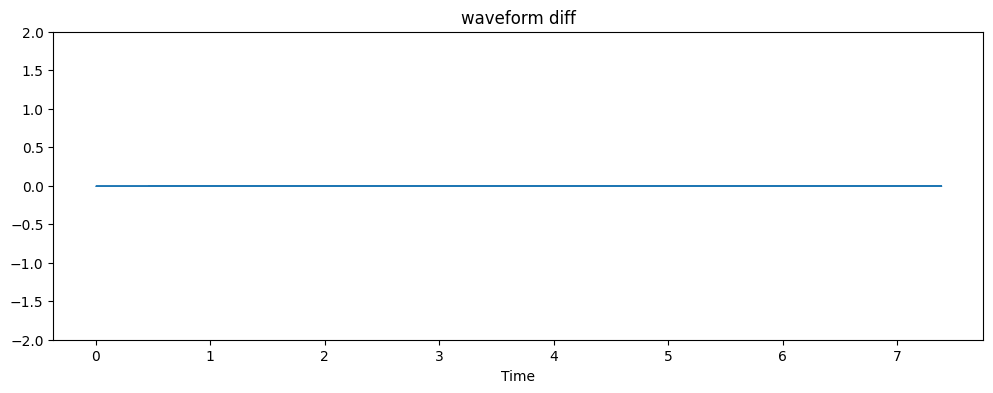

Feature Total Diffs:
waveform: 0.001327559
flatness: 2.6012788
rms: 0.0152054
centroid: 10578.314311025028


In [7]:
conduct_trial(0)

trial: 1 | target radius =  0.05
Delayed Signal:


Diff:


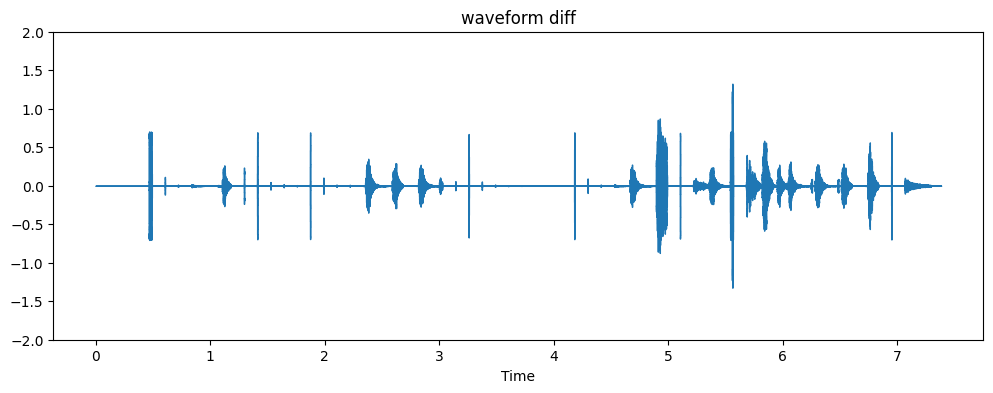

Feature Total Diffs:
waveform: 11201.778
flatness: 4.399636
rms: 1.5711164
centroid: 33837.938860487935


In [8]:
conduct_trial(1)

trial: 2 | target radius =  0.1
Delayed Signal:


Diff:


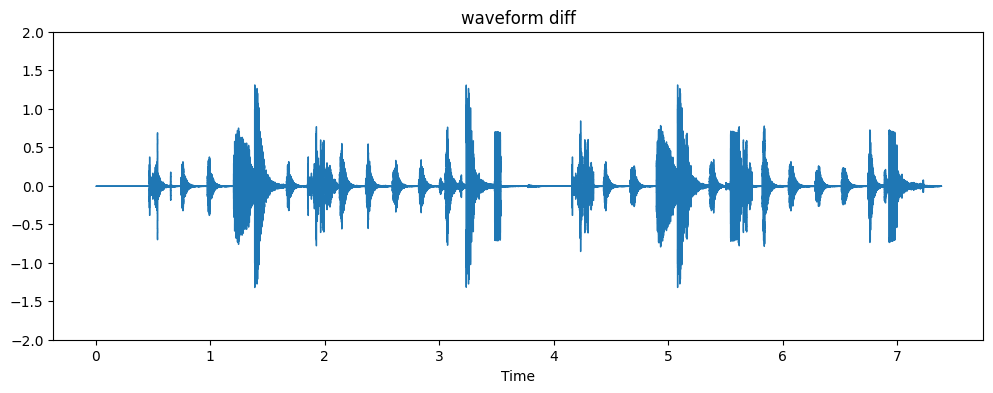

Feature Total Diffs:
waveform: 17500.953
flatness: 4.7202744
rms: 3.8908522
centroid: 57546.67012027467


In [9]:
conduct_trial(2)

trial: 3 | target radius =  0.15
Delayed Signal:


Diff:


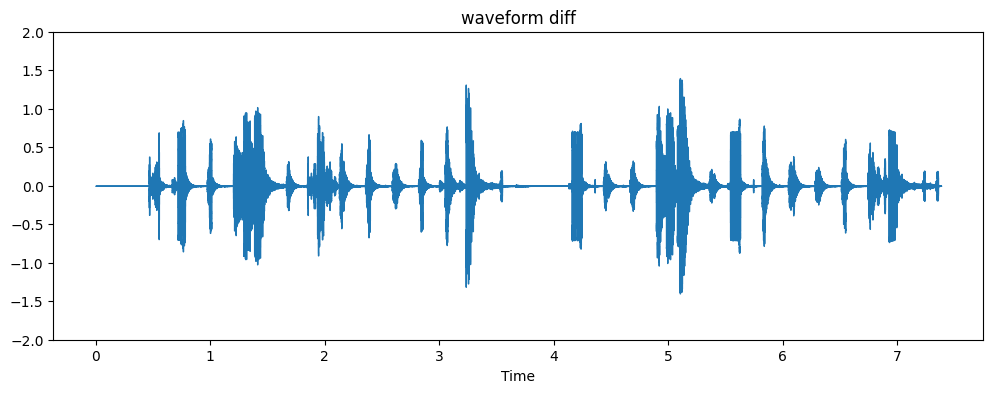

Feature Total Diffs:
waveform: 18964.66
flatness: 7.216794
rms: 6.242026
centroid: 84056.77483460688


In [10]:
conduct_trial(3)

trial: 4 | target radius =  0.25
Delayed Signal:


Diff:


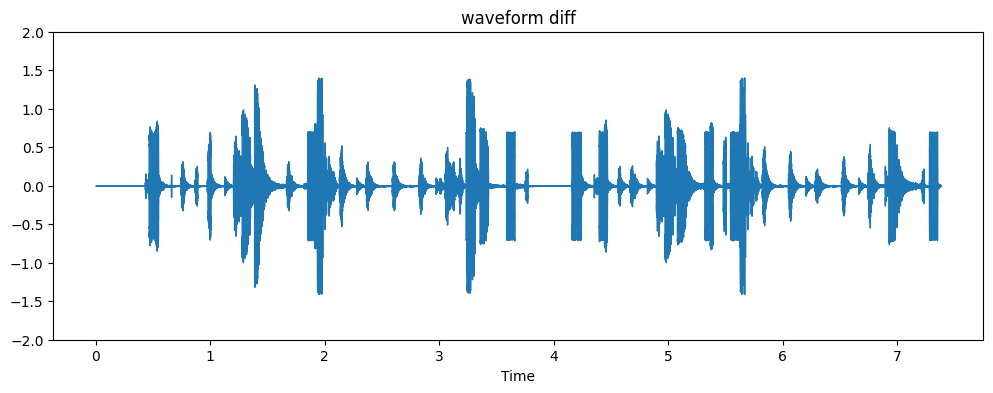

Feature Total Diffs:
waveform: 27671.09
flatness: 7.2792788
rms: 12.556301
centroid: 106401.14599367764


In [11]:
conduct_trial(4)

trial: 5 | target radius =  0.5
Delayed Signal:


Diff:


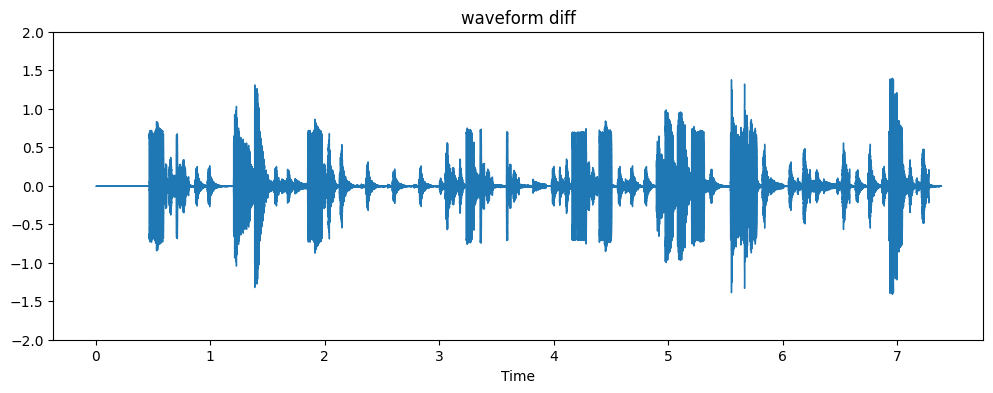

Feature Total Diffs:
waveform: 33917.184
flatness: 9.064542
rms: 20.870796
centroid: 226714.06623346763


In [12]:
conduct_trial(5)

trial: 6 | target radius =  0.75
Delayed Signal:


Diff:


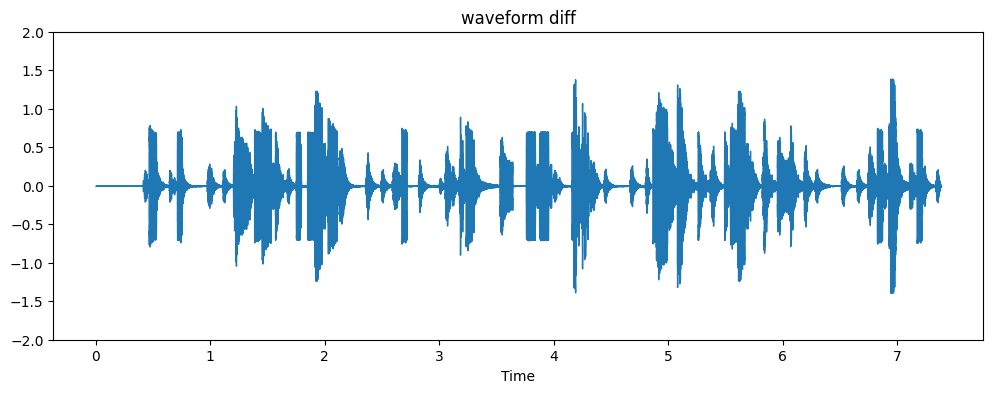

Feature Total Diffs:
waveform: 39511.97
flatness: 11.094793
rms: 24.322271
centroid: 236060.27118044486


In [13]:
conduct_trial(6)

trial: 7 | target radius =  1.0
Delayed Signal:


Diff:


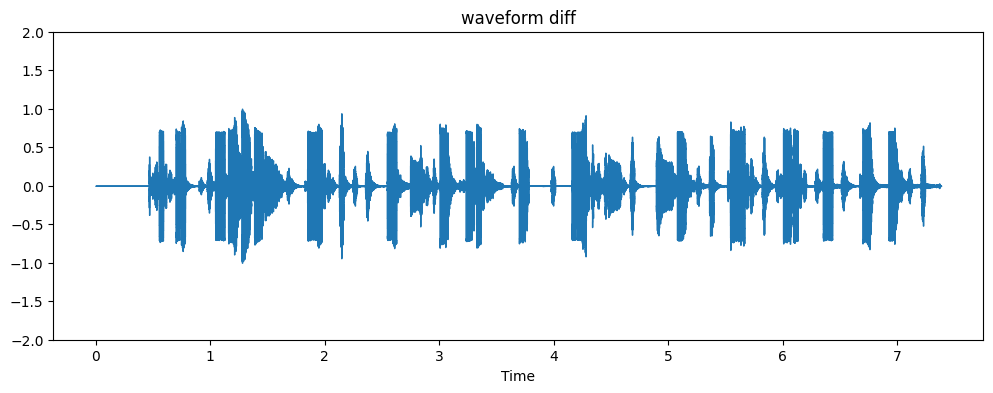

Feature Total Diffs:
waveform: 37883.61
flatness: 10.752157
rms: 25.880144
centroid: 281070.4397299821


In [14]:
conduct_trial(7)

The amount of difference does, in fact, grow in correlation with the target radius.

Also notice how, the amount of difference is often higher in the second half of the waveform (especially in the earlier trial with smaller target radius). This is because that is after the loop repeats and the delay line is now populated with very similar segments from the last repeat of the loop (as well as simply being more populated with audio to potentially select). This pattern because less noticeable as the target radius grows towards 1.0, or complete random selection.

# Total Diffs vs. Target Radius Plotted

Below we have graphs plotting the total waveform and feature diffs, as computed in the trials above, plotted, where the x axis is the target radius used for that trial.

Measurements are taken closer together in the lower range of target radii because small differences in target radius are more influential in that range.

The correlation between target radius and diff is also computed and displayed.

We expect to see strong correlation as the target radius increases.

Audio waveform diff:
Correlation = 0.9761904761904763


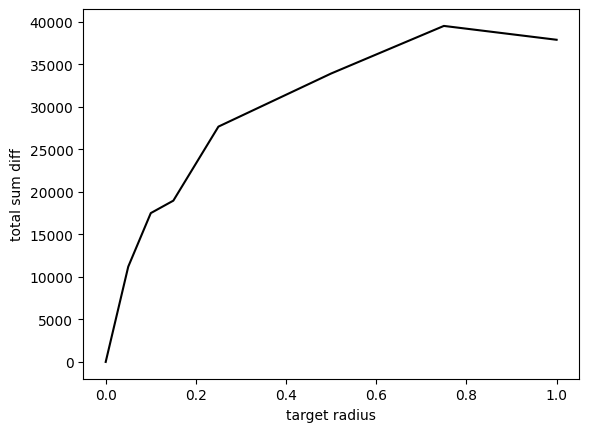

In [15]:
# waveform diff
print('Audio waveform diff:')
data = ([trial['target_radius'] for trial in trials], [trial['total_diff'] for trial in trials])
plt.plot(data[0], data[1], color='black')
plt.ylabel('total sum diff')
plt.xlabel('target radius')

waveform_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(waveform_correlation))
plt.show()

Flatness diff:
Correlation = 0.9761904761904763


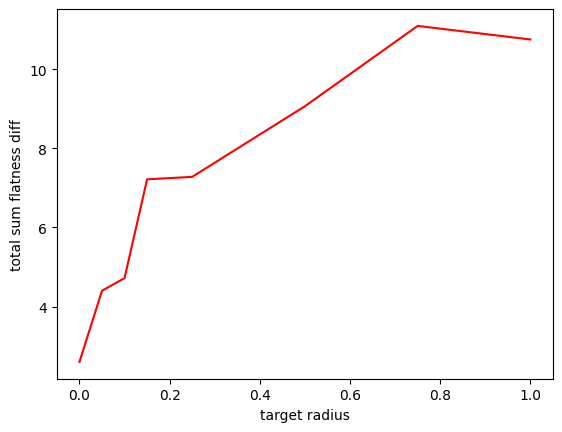

In [16]:
# flatness diff
print('Flatness diff:')
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['flatness'] for trial in trials])
plt.plot(data[0], data[1], 'r')
plt.ylabel('total sum flatness diff')
plt.xlabel('target radius')

flatness_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(flatness_correlation))
plt.show()

RMS diff:
Correlation = 1.0


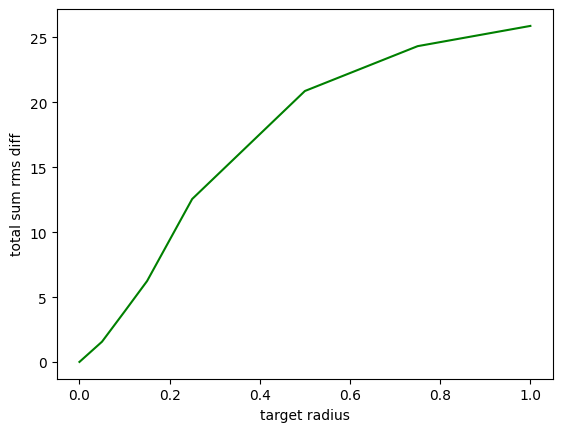

In [17]:
# rms diff
print('RMS diff:')
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['rms'] for trial in trials])
plt.plot(data[0], data[1], 'g')
plt.ylabel('total sum rms diff')
plt.xlabel('target radius')

rms_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(rms_correlation))
plt.show()

Centroid diff:
Correlation = 1.0


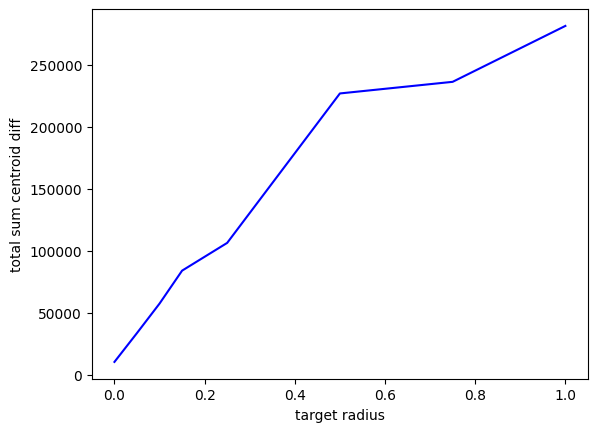

In [18]:
# centroid diff
print('Centroid diff:')
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['centroid'] for trial in trials])
plt.plot(data[0], data[1], 'b')
plt.ylabel('total sum centroid diff')
plt.xlabel('target radius')

centroid_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(centroid_correlation))
plt.show()

All diffs:


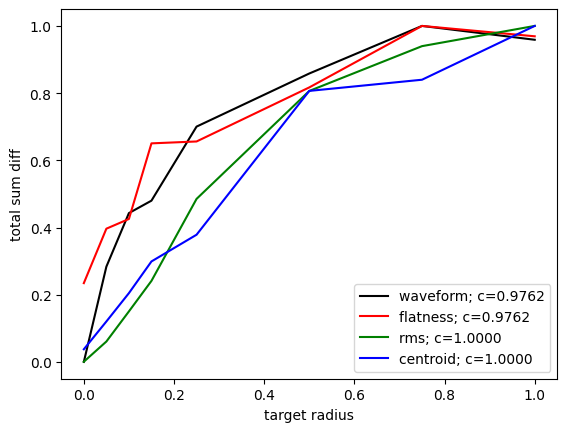

In [19]:
# all together
print('All diffs:')
data = ([trial['target_radius'] for trial in trials], [trial['total_diff'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'black', label=('waveform; c=' + '{0:.4f}'.format(waveform_correlation)))
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['flatness'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'r', label=('flatness; c=' + '{0:.4f}'.format(flatness_correlation)))
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['rms'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'g', label=('rms; c=' + '{0:.4f}'.format(rms_correlation)))
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['centroid'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'b', label=('centroid; c=' + '{0:.4f}'.format(centroid_correlation)))
plt.ylabel('total sum diff')
plt.xlabel('target radius')
plt.legend()
plt.show()

We do see a strong correlation between target radius and the differences measured, both the feature analysis and the waveform.

The hump you can see, especially in flatness and waveform, is due to how the segments cluster in the feature space. For example, in this audio there are a few main clusters that are formed corresponding to music events: kick, snare, and hats. A spike in variation occurs at 0.1-0.2 because this is where all the values in a given cluster are within a sphere of that radius. The variation introduced then plateaus until the target radius is large enough for clusters to overlap and start selecting from each other.